In [1]:
from utils import setup_dataloaders
from utils import plot_utils
from microsplit_reproducibility.notebook_utils.custom_dataset_2D import get_input, get_target
from pathlib import Path
import pickle
import tifffile as tiff

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
def load_prediction(path):
    path = Path(path)
    if path.suffix in [".pkl", ".dill"]:
        with open(path, "rb") as f:
            return pickle.load(f)
    else:
        # TIFF expected shape: (N, C, H, W)
        return tiff.imread(path).transpose(0, 2, 3, 1)

In [4]:
img_og = load_prediction("/group/jug/aman/Processed_Results_30Oct25/PAVIA_ATN/pred_test_dset_microsplit_og.tiff")
img_sw = load_prediction("/group/jug/aman/Processed_Results_30Oct25/PAVIA_ATN/pred_test_dset_microsplit_stitched.tiff")

In [5]:
model, experiment_config, train_dset, val_dset, test_dset = setup_dataloaders.setup_dataset_PAVIA_ATN(sliding_window_flag=False)
tar = get_target(test_dset)
inp = get_input(test_dset)

🔧 Setting up PAVIA_ATN environment
Dataclass is <class 'careamics.lvae_training.dataset.lc_dataset.LCMultiChDloader'>

Padding is not used with this alignement style

Padding is not used with this alignement style

Padding is not used with this alignement style


/home/aman.kukde/Projects_2/careamics/src/careamics/utils/serializers.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(lst)


[GaussianMixtureNoiseModel] min_sigma: 200.0
[GaussianMixtureNoiseModel] min_sigma: 200.0
[MultiChannelNoiseModel] Nmodels count:2
[GaussianLikelihood] PredLVar:pixelwise LowBLVar:-5.0
Loaded model from /group/jug/aman/microsplit_pavia_23Oct25/checkpoints/best-epoch=43.ckpt
✅ Loaded pretrained checkpoint from: /group/jug/aman/microsplit_pavia_23Oct25/checkpoints/best-epoch=43.ckpt
✅ Environment setup complete.


/tmp/ipykernel_22247/752985186.py:130: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


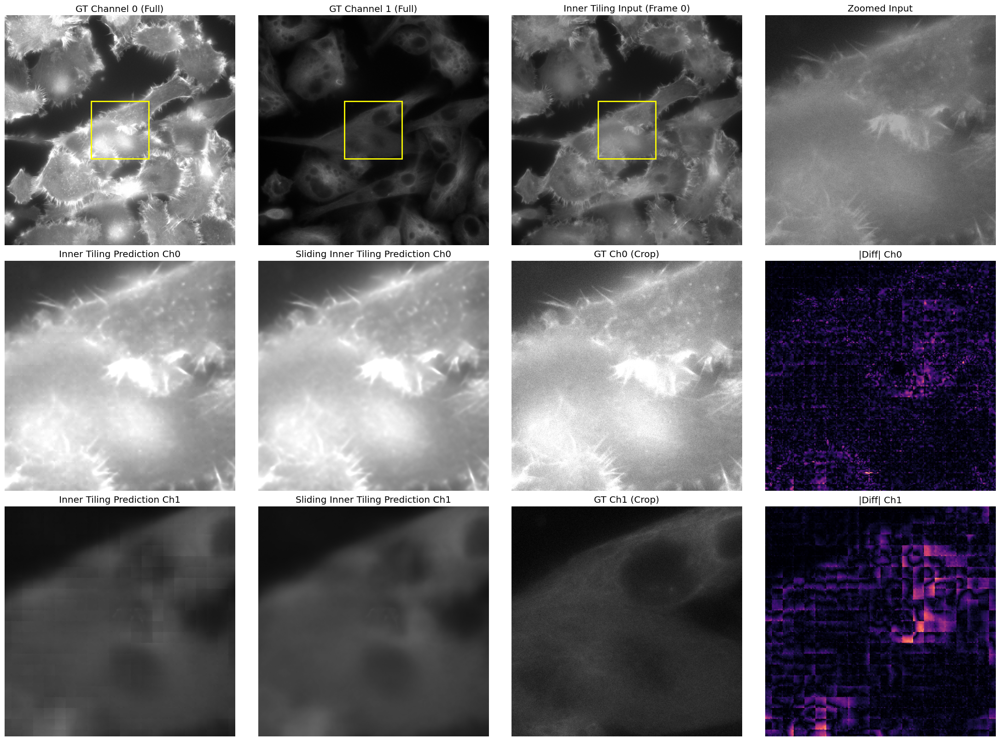

In [25]:

def full_frame_evaluation_zoomed(
    predictions_list,
    tar_list,
    inp_list,
    frame_idx,
    titles,
    save_path=None
):
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    import matplotlib.patches as patches
    import numpy as np

    # Validate input lengths
    n_methods = len(predictions_list)
    assert len(tar_list) == n_methods and len(inp_list) == n_methods, \
        "predictions_list, tar_list, and inp_list must have the same length"
    assert len(titles) >= n_methods, \
        "titles must have at least as many entries as there are methods"

    # === Normalization range based on GT ===
    all_targets = np.concatenate([t for t in tar_list], axis=-1)
    vmin = np.nanpercentile(all_targets, 1)
    vmax = np.nanpercentile(all_targets, 99)
    if vmin == vmax:
        vmin, vmax = 0, 1

    # === Figure setup ===
    fig = plt.figure(figsize=(22, 16), constrained_layout=True)
    gs = GridSpec(3, 4, figure=fig)
    plt.rcParams.update({'font.size': 12})

    # === Compute full input and crop region ===
    full_input_img = np.mean(inp_list[0][..., :2], axis=-1)
    H, W = full_input_img.shape
    crop_h = H // 4
    crop_w = W // 4
    crop_y = (H - crop_h) // 2
    crop_x = (W - crop_w) // 2
    crop_slice_y = slice(crop_y, crop_y + crop_h)
    crop_slice_x = slice(crop_x, crop_x + crop_w)
    rect_kwargs = dict(linewidth=2, edgecolor='yellow', facecolor='none')

    # === Prepare crops ===
    preds_crops = []
    targets_crops = []
    for i in range(n_methods):
        targets_crops.append(tar_list[i][crop_slice_y, crop_slice_x, :])
        preds_crops.append(predictions_list[i][crop_slice_y, crop_slice_x, :])

    # === Row 1: GTs, full input, zoomed input ===
    full_target = tar_list[0]

    # GT channel 0
    ax_gt0 = fig.add_subplot(gs[0, 0])
    ax_gt0.imshow(full_target[..., 0], cmap='gray', vmin=vmin, vmax=vmax)
    ax_gt0.set_title("GT Channel 0 (Full)")
    ax_gt0.add_patch(patches.Rectangle((crop_x, crop_y), crop_w, crop_h, **rect_kwargs))
    ax_gt0.axis('off')

    # GT channel 1
    ax_gt1 = fig.add_subplot(gs[0, 1])
    ax_gt1.imshow(full_target[..., 1], cmap='gray', vmin=vmin, vmax=vmax)
    ax_gt1.set_title("GT Channel 1 (Full)")
    ax_gt1.add_patch(patches.Rectangle((crop_x, crop_y), crop_w, crop_h, **rect_kwargs))
    ax_gt1.axis('off')

    # Full input
    ax_inp_full = fig.add_subplot(gs[0, 2])
    ax_inp_full.imshow(full_input_img, cmap='gray', vmin=vmin, vmax=vmax)
    ax_inp_full.set_title(f"{titles[0]} Input (Frame {frame_idx})")
    ax_inp_full.add_patch(patches.Rectangle((crop_x, crop_y), crop_w, crop_h, **rect_kwargs))
    ax_inp_full.axis('off')

    # Zoomed input
    ax_inp_zoom = fig.add_subplot(gs[0, 3])
    ax_inp_zoom.imshow(full_input_img[crop_slice_y, crop_slice_x], cmap='gray', vmin=vmin, vmax=vmax)
    ax_inp_zoom.set_title("Zoomed Input")
    ax_inp_zoom.axis('off')

    # === Row 2: Predictions (Channel 0) ===
    ax_pred_orig_ch0 = fig.add_subplot(gs[1, 0])
    ax_pred_orig_ch0.imshow(preds_crops[0][..., 0], cmap='gray', vmin=vmin, vmax=vmax)
    ax_pred_orig_ch0.set_title(f"{titles[0]} Prediction Ch0")
    ax_pred_orig_ch0.axis('off')

    ax_pred_slide_ch0 = fig.add_subplot(gs[1, 1])
    ax_pred_slide_ch0.imshow(preds_crops[1][..., 0], cmap='gray', vmin=vmin, vmax=vmax)
    ax_pred_slide_ch0.set_title(f"{titles[1]} Prediction Ch0")
    ax_pred_slide_ch0.axis('off')

    # Add GT ch0 again for visual alignment reference
    ax_gt_crop_ch0 = fig.add_subplot(gs[1, 2])
    ax_gt_crop_ch0.imshow(targets_crops[0][..., 0], cmap='gray', vmin=vmin, vmax=vmax)
    ax_gt_crop_ch0.set_title("GT Ch0 (Crop)")
    ax_gt_crop_ch0.axis('off')

    # Optional: difference map between two methods (abs diff)
    diff_ch0 = np.abs(preds_crops[0][..., 0] - preds_crops[1][..., 0])
    ax_diff_ch0 = fig.add_subplot(gs[1, 3])
    ax_diff_ch0.imshow(diff_ch0, cmap='magma')
    ax_diff_ch0.set_title("|Diff| Ch0")
    ax_diff_ch0.axis('off')

    # === Row 3: Predictions (Channel 1) ===
    ax_pred_orig_ch1 = fig.add_subplot(gs[2, 0])
    ax_pred_orig_ch1.imshow(preds_crops[0][..., 1], cmap='gray', vmin=vmin, vmax=vmax)
    ax_pred_orig_ch1.set_title(f"{titles[0]} Prediction Ch1")
    ax_pred_orig_ch1.axis('off')

    ax_pred_slide_ch1 = fig.add_subplot(gs[2, 1])
    ax_pred_slide_ch1.imshow(preds_crops[1][..., 1], cmap='gray', vmin=vmin, vmax=vmax)
    ax_pred_slide_ch1.set_title(f"{titles[1]} Prediction Ch1")
    ax_pred_slide_ch1.axis('off')

    # Add GT ch1 again for comparison
    ax_gt_crop_ch1 = fig.add_subplot(gs[2, 2])
    ax_gt_crop_ch1.imshow(targets_crops[0][..., 1], cmap='gray', vmin=vmin, vmax=vmax)
    ax_gt_crop_ch1.set_title("GT Ch1 (Crop)")
    ax_gt_crop_ch1.axis('off')

    # Optional: difference map for ch1
    diff_ch1 = np.abs(preds_crops[0][..., 1] - preds_crops[1][..., 1])
    ax_diff_ch1 = fig.add_subplot(gs[2, 3])
    ax_diff_ch1.imshow(diff_ch1, cmap='magma')
    ax_diff_ch1.set_title("|Diff| Ch1")
    ax_diff_ch1.axis('off')

    # === Margins and spacing ===
    fig.subplots_adjust(
        left=0.10,
        right=0.90,
        top=0.90,
        bottom=0.10,
        wspace=0.10,
        hspace=0.50
    )

    # === Save or show ===
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        plt.close(fig)
    else:
        plt.show()

idx = 0
full_frame_evaluation_zoomed(
    predictions_list=[img_og[idx], img_sw[idx]],
    tar_list=[test_dset._data[idx], test_dset._data[idx]],
    inp_list=[inp[idx], inp[idx]],
    frame_idx=idx,
    titles=["Inner Tiling", "Sliding Inner Tiling"],
)

In [36]:
def plot_full_comparison(
    predictions_list,  # [method1, method2]
    tar_list,           # [GT] or [GT per method] – we'll use the first
    inp_list,           # [inputs]
    frame_idx,
    titles,             # ["Method 1", "Method 2"]
    save_path=None
):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    import matplotlib.patches as patches

    # --- Normalization based on GT (per-channel) ---
    gt = tar_list[0]
    vmin_ch = []
    vmax_ch = []
    for ch in range(gt.shape[-1]):
        all_targets_ch = np.concatenate([t[..., ch][..., None] for t in tar_list], axis=-1)
        vmin = np.nanpercentile(all_targets_ch, 1)
        vmax = np.nanpercentile(all_targets_ch, 99)
        if vmin == vmax:
            vmin, vmax = 0, 1
        vmin_ch.append(vmin)
        vmax_ch.append(vmax)

    # --- Prepare full input and crop coordinates ---
    full_input = inp_list[0][..., 0]  # single-channel input
    H, W = full_input.shape
    crop_h, crop_w = H // 4, W // 4
    crop_y, crop_x = (H - crop_h) // 2, (W - crop_w) // 2
    crop_slice_y = slice(crop_y, crop_y + crop_h)
    crop_slice_x = slice(crop_x, crop_x + crop_w)

    # --- Prepare zoomed regions ---
    input_zoom = full_input[crop_slice_y, crop_slice_x]
    gt_zoom = gt[crop_slice_y, crop_slice_x, :]
    preds_zoom = [p[crop_slice_y, crop_slice_x, :] for p in predictions_list]

    # --- Diff maps (cropped, abs difference between methods) ---
    diff_maps = [
        np.abs(predictions_list[0][crop_slice_y, crop_slice_x, ch] -
               predictions_list[1][crop_slice_y, crop_slice_x, ch])
        for ch in range(gt.shape[-1])
    ]

    # --- Figure setup ---
    fig = plt.figure(figsize=(26, 10))
    gs = GridSpec(2, 6, figure=fig, wspace=0.1, hspace=0.15)

    # --- Yellow rectangle to mark zoom region ---
    rect = patches.Rectangle((crop_x, crop_y), crop_w, crop_h,
                             linewidth=2, edgecolor='yellow', facecolor='none')

    # ========== ROW 1 (Channel 1) ==========
    # Col 1: Input (full)
    ax = fig.add_subplot(gs[0, 0])
    ax.imshow(full_input, cmap='gray')
    ax.add_patch(rect)
    ax.set_title(f"Input")
    ax.axis('off')

    # Col 2: Target Ch1 (full)
    ax = fig.add_subplot(gs[0, 1])
    ax.imshow(gt[..., 1], cmap='gray', vmin=vmin_ch[1], vmax=vmax_ch[1])
    ax.add_patch(patches.Rectangle((crop_x, crop_y), crop_w, crop_h,
                                   linewidth=2, edgecolor='yellow', facecolor='none'))
    ax.set_title("Target Channel 1")
    ax.axis('off')

    # Col 3: Target Ch1 (zoomed)
    ax = fig.add_subplot(gs[0, 2])
    ax.imshow(gt_zoom[..., 1], cmap='gray', vmin=vmin_ch[1], vmax=vmax_ch[1])
    ax.set_title("GT")
    ax.axis('off')

    # Col 4 & 5: Predictions Ch1 (two methods)
    for i in range(2):
        ax = fig.add_subplot(gs[0, 3 + i])
        ax.imshow(preds_zoom[i][..., 1], cmap='gray', vmin=vmin_ch[1], vmax=vmax_ch[1])
        ax.set_title(f"{titles[i]} Prediction")
        ax.axis('off')

    # # Col 6: Diff Ch1
    # ax = fig.add_subplot(gs[0, 5])
    # im = ax.imshow(diff_maps[1], cmap='bwr')
    # ax.set_title("Diff |Δ| Ch1")
    # ax.axis('off')
    # fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # ========== ROW 2 (Channel 0) ==========
    # Col 1: Input (zoomed)
    ax = fig.add_subplot(gs[1, 0])
    ax.imshow(input_zoom, cmap='gray')
    ax.set_title("Input (Up Close)")
    ax.axis('off')

    # Col 2: Target Ch0 (full)
    ax = fig.add_subplot(gs[1, 1])
    ax.imshow(gt[..., 0], cmap='gray', vmin=vmin_ch[0], vmax=vmax_ch[0])
    ax.add_patch(patches.Rectangle((crop_x, crop_y), crop_w, crop_h,
                                   linewidth=2, edgecolor='yellow', facecolor='none'))
    ax.set_title("Target Channel 2")
    ax.axis('off')

    # Col 3: Target Ch0 (zoomed)
    ax = fig.add_subplot(gs[1, 2])
    ax.imshow(gt_zoom[..., 0], cmap='gray', vmin=vmin_ch[0], vmax=vmax_ch[0])
    ax.set_title("GT")
    ax.axis('off')

    # Col 4 & 5: Predictions Ch0 (two methods)
    for i in range(2):
        ax = fig.add_subplot(gs[1, 3 + i])
        ax.imshow(preds_zoom[i][..., 0], cmap='gray', vmin=vmin_ch[0], vmax=vmax_ch[0])
        ax.set_title(f"{titles[i]} Prediction")
        ax.axis('off')

    # # Col 6: Diff Ch0
    # ax = fig.add_subplot(gs[1, 5])
    # im = ax.imshow(diff_maps[0], cmap='bwr')
    # ax.set_title("Diff |Δ| Ch0")
    # ax.axis('off')
    # fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        plt.close(fig)
    else:
        plt.show()


/tmp/ipykernel_22247/440769137.py:126: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


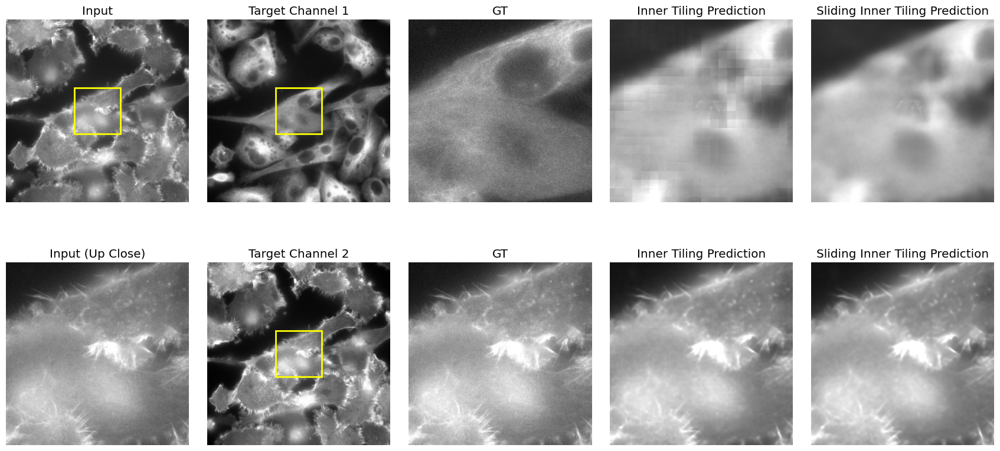

In [37]:
idx = 0
plot_full_comparison(
    predictions_list=[img_og[idx], img_sw[idx]],
    tar_list=[test_dset._data[idx], test_dset._data[idx]],
    inp_list=[inp[idx], inp[idx]],
    frame_idx=idx,
    titles=["Inner Tiling", "Sliding Inner Tiling"],
)

/home/aman.kukde/sliding_windowed_tiling/analysis/utils/plot_utils.py:621: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


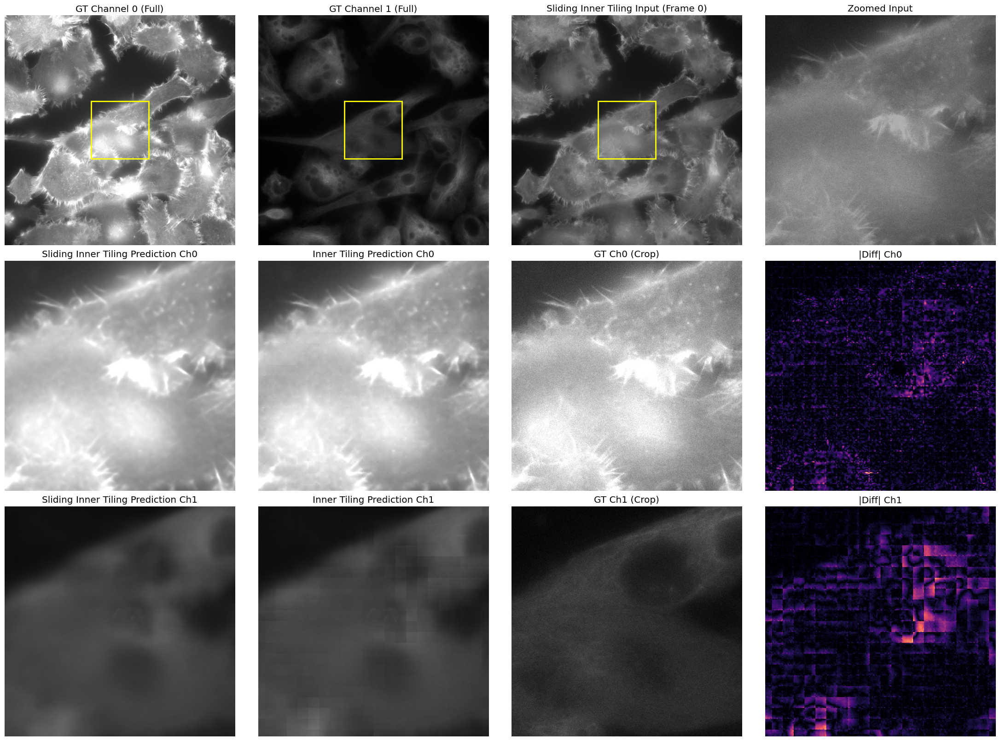

In [17]:
idx = 0
plot_utils.full_frame_evaluation_zoomed(
    predictions_list=[img_sw[idx], img_og[idx]],
    tar_list=[test_dset._data[idx], test_dset._data[idx]],
    inp_list=[inp[idx], inp[idx]],
    frame_idx=idx,
    titles=["Sliding Inner Tiling", "Inner Tiling"],
)

/home/aman.kukde/sliding_windowed_tiling/analysis/utils/plot_utils.py:762: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.


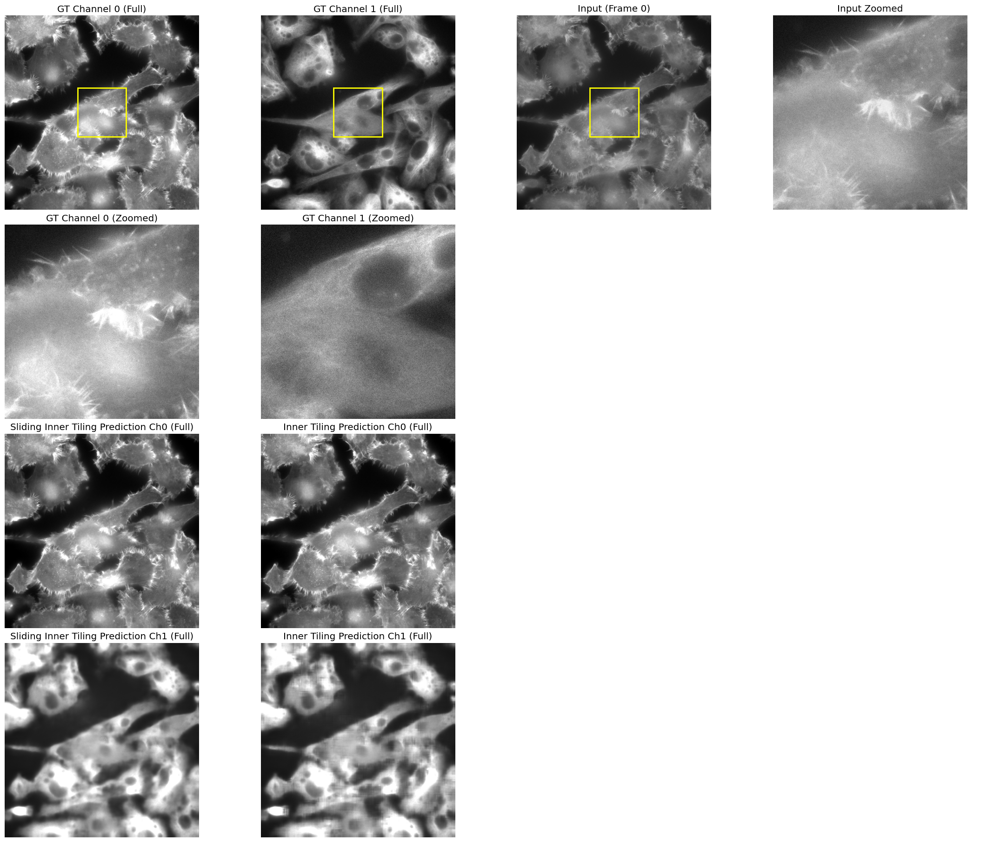

In [19]:
idx = 0
plot_utils.full_frame_evaluation_zoomed(
    predictions_list=[img_sw[idx], img_og[idx]],
    tar_list=[test_dset._data[idx], test_dset._data[idx]],
    inp_list=[inp[idx], inp[idx]],
    frame_idx=idx,
    titles=["Sliding Inner Tiling", "Inner Tiling"],
)